In [3]:
import dynamiqs as dq
import jax
import jax.numpy as jnp # the JAX version of numpy
from matplotlib import pyplot as plt

$$
\begin{aligned}
\hat{H} &= \hat{H}_{\mathrm{2ph}} + \hat{H}_d,\qquad \mathrm{with}\\
\hat{H}_{\mathrm{2ph}} &= g_2 {{}\hat{a}^\dagger}^2 \hat{b} + g_2^* \hat{a}^2 \hat{b}^\dagger,\\
\hat{H}_d &= \epsilon_d^* \hat{b} + \epsilon_d \hat{b}^\dagger.
\end{aligned}
$$

In [4]:
import dynamiqs as dq
dq.set_device('cpu')

na = 20  
# Fock states for subsystem A
nb = 5   

#identity operators for each subsystem
Ia = dq.eye(na)
Ib = dq.eye(nb)

a = dq.destroy(na)
b = dq.destroy(nb)
numTimes = 1000
# Embed operators into the composite Hilbert space
a_tensored = dq.tensor(a, Ib)    
adag_tensored = dq.dag(a_tensored)
b_tensored = dq.tensor(Ia, b)     
bdag_tensored = dq.dag(b_tensored)

g2 = 1.0
eps = -4.0

H2ph = g2 * (adag_tensored @ adag_tensored @ b_tensored) + g2.conjugate() * (a_tensored @ a_tensored @ bdag_tensored)
kappaB = 10
# Drive term: eps (I_a ⊗ b†) + eps* (I_a ⊗ b)
Hd = eps * bdag_tensored + eps.conjugate() * b_tensored

# Full Hamiltonian
H = H2ph + Hd  # Now all terms act on the composite space (na ⊗ nb)

In [5]:
T = 4
psi0a = dq.fock(na,0)
psi0b = dq.fock(nb,0)
psi0 = dq.tensor(psi0a, psi0b)
t_save = jnp.linspace(0, T, numTimes)  # save times
result = dq.sesolve(H, psi0, t_save)
print(result)

|██████████| 100.0% ◆ elapsed 8.07ms ◆ remaining 0.00ms

==== SESolveResult ====
Solver : Tsit5
Infos  : 81 steps (78 accepted, 3 rejected)
States : QArray complex64 (1000, 100, 1) | 781.2 Kb


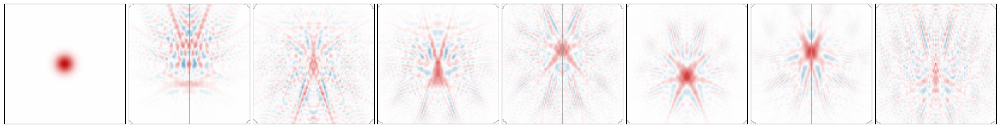

In [6]:
dq.plot.wigner_mosaic(result.states, cross = True)

100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


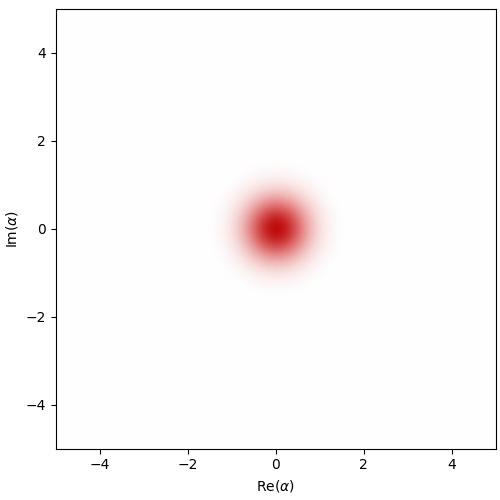

In [7]:
dq.plot.wigner_gif(result.states, gif_duration = 2, fps = 25)

In [8]:


numOp = dq.tensor(dq.number(na), dq.eye(nb))

def parity(n):
    diag = jnp.array([(-1)**i for i in range(n)], dtype=jnp.complex128)
    return diag

# Create a diagonal matrix from the parity vector.
parity_diag_matrix = jnp.diag(parity(na))

# to a Qarray.
Pa_a = dq.asqarray(parity_diag_matrix, dims=(na,))


Ib = dq.eye(nb)

PaOp = dq.tensor(Pa_a, Ib)


# expectation value of the photons




/var/folders/ch/4w1x88c120g72bpx7rj47ktw0000gn/T/ipykernel_87794/1200739366.py:4: UserWarning: Explicitly requested dtype <class 'jax.numpy.complex128'> requested in array is not available, and will be truncated to dtype complex64. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/jax-ml/jax#current-gotchas for more.
  diag = jnp.array([(-1)**i for i in range(n)], dtype=jnp.complex128)


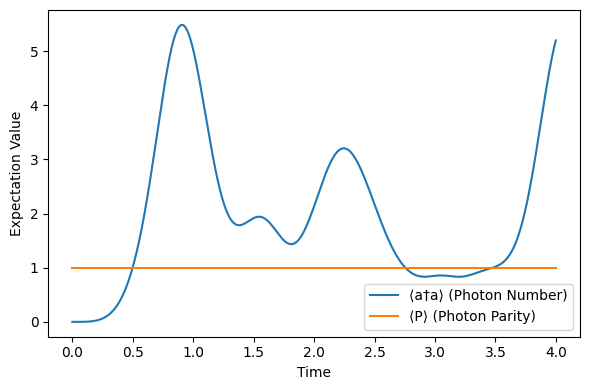

In [9]:
num_expect = []
parity_expect = []

for state in result.states:
    num_val = dq.expect(numOp, state).real  
    # <state|num|state>
    parity_val = dq.expect(PaOp, state).real  
    # <PaOp|num|PaOp>
    num_expect.append(num_val)
    parity_expect.append(parity_val)

num_expect = jnp.array(num_expect)
parity_expect = jnp.array(parity_expect)

# Now plot the observables versus time (assuming t_save is your array of times):
t_save = jnp.linspace(0, 4, len(result.states))  # or your actual t_save array

plt.figure(figsize=(6,4))
plt.plot(t_save, num_expect, label="⟨a†a⟩ (Photon Number)")
plt.plot(t_save, parity_expect, label="⟨P⟩ (Photon Parity)")
plt.xlabel("Time")
plt.ylabel("Expectation Value")
plt.legend()
plt.tight_layout()
plt.show()

In [10]:
psi0.shape

(100, 1)

## Task 1.2
We now want to find the distance between the new operator norm and  $\hat{\rho}$, 

In [11]:
import numpy as np
def displacementOp(alph,a,adag):
    exponent =alph@a-alph.conjugate@adag
    return dq.expm(exponent)
# ^displacement op
alpha = np.sqrt(-eps/(g2.conjugate()))
alpha



np.float64(2.0)

In [12]:

D_memory = dq.displace(na, alpha)


kappa2 = 4*abs(g2)**2/kappaB
# D = displacementOp(alpha,a_tensored,adag_tensored)
# Our jump operator is just sqrt(kappa)*D!
D = dq.tensor(D_memory,Ib)
jump_ops = [jnp.sqrt(kappa2)*D]
Hzero = dq.tensor(dq.zeros(na), Ib)
tsave = jnp.linspace(0,T,numTimes)
onePointTwo = dq.mesolve(Hzero,jump_ops,psi0,tsave)
# We only need a zero hamiltonian because we're not coupled to the outside
# anymore
onePointTwo

MESolveResult(
  tsave=f32[1000],
  solver=Tsit5(
    rtol=weak_f32[],
    atol=weak_f32[],
    safety_factor=weak_f32[],
    min_factor=weak_f32[],
    max_factor=weak_f32[],
    max_steps=weak_i32[]
  ),
  gradient=None,
  options=Options(
    save_states=bool[],
    save_propagators=bool[],
    cartesian_batching=bool[],
    progress_meter=TqdmProgressMeter(),
    t0=None,
    save_extra=None
  ),
  _saved=SolveSaved(
    ysave=DenseQArray(dims=(20, 5), vectorized=False, data=c64[1000,100,100]),
    extra=None,
    Esave=None
  ),
  infos=AdaptiveStepInfos(
    nsteps=weak_i32[],
    naccepted=weak_i32[],
    nrejected=weak_i32[]
  )
)

|          |   0.2% ◆ elapsed 13.95ms ◆ remaining 0.00ms

In [13]:
onePointTwoList = [state for state in onePointTwo.states]
rho_a_list = [state for state in result.states]

fidelities = []
for rho_full, rho_eff in zip(rho_a_list, onePointTwoList):
    fid = dq.fidelity(rho_full, rho_eff)
    fidelities.append(fid)
fidelities = jnp.array(fidelities)

|██████████| 100.0% ◆ elapsed 117.99ms ◆ remaining 0.00ms


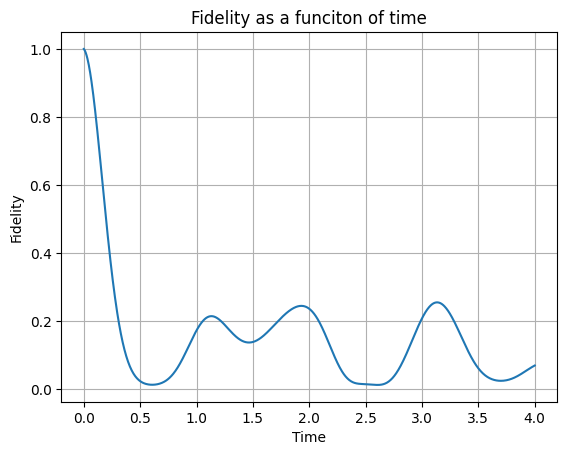

In [14]:
plt.plot(tsave,fidelities)
plt.ylabel("Fidelity")
plt.xlabel("Time")
plt.title("Fidelity as a funciton of time")
plt.grid()

### Reasoning
We could tell this graph was accurate due to the fact that the fidelity was 1 at the beggining. Without a buffer, we have no energy coupling, and only evolve due to the jump operator. It then makes sense that the fidelity of our simulation versus without the buffer falls quickly. It also makes sense that the fidelity in the long run has an oscillatory nature due to the periodicity of the nature

https://www.dynamiqs.org/stable/documentation/getting_started/sharp-bits.html
https://www.dynamiqs.org/stable/python_api/solver/Expm.html
https://www.dynamiqs.org/stable/python_api/utils/general/fidelity.html#dynamiqs.utils.general.fidelity
https://www.dynamiqs.org/stable/python_api/utils/operators/displace.html#dynamiqs.utils.operators.displace
https://www.dynamiqs.org/stable/documentation/advanced_examples/kerr-oscillator.html


## Task 1.3 

|██████████| 100.0% ◆ elapsed 5.37ms ◆ remaining 0.00ms


==== SESolveResult ====
Solver : Tsit5
Infos  : 27 steps (27 accepted, 0 rejected)
States : QArray complex64 (1000, 100, 1) | 781.2 Kb


100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


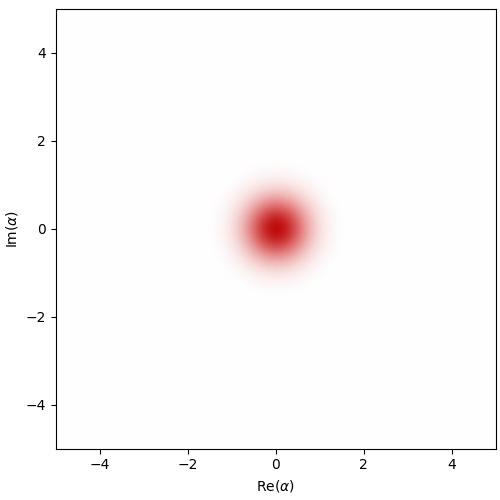

In [18]:
epsilon_z =1+1j

H = epsilon_z.conjugate()*a_tensored+epsilon_z*adag_tensored
psi0a = dq.fock(na,0)
psi0b = dq.fock(nb,0)
psi0 = dq.tensor(psi0a, psi0b)
t_save = jnp.linspace(0, T, numTimes)  # save times
result = dq.sesolve(H, psi0, t_save)
print(result)
dq.plot.wigner_gif(result.states, gif_duration = 2, fps = 25)

In [ ]:
def danieltest(epsilon):

    H = epsilon_z.conjugate()*a_tensored+epsilon_z*adag_tensored
    dq.plot.wigner_gif(result.states, gif_duration = 2, fps = 25)

danieltest(1+np.pi*1j)


100%|██████████| 50/50 [00:06<00:00,  7.47it/s]


AttributeError: module 'dynamiqs.plot' has no attribute 'show'

## Task 1.4

In [ ]:
#PARAMETERS

import optax

#simulation
n = 8
K = 200.0
kappa = 1.0
T = 3.0             # total time = 3
ntsave = 401        # idk

#optimization
ntpulse = 101       # number of bins
nepochs = 300       # number of optimization epochs (idk)
learning_rate = 0.2 # gradient descent learning rate (idk)

# operators, initial state, and expectation operator
a = dq.destroy(n)
H0 = -K * a.dag() @ a.dag() @ a @ a                             # initial state of Hamiltonian???
jump_ops = [jnp.sqrt(kappa) * a]
psi0 = dq.basis(n, 0)
exp_ops = [dq.proj(dq.basis(n, 0)), dq.proj(dq.basis(n, 1))]

# save times and pulse times (not necessarily the same) (no clue what these are tbh)
tsave = jnp.linspace(0.0, T, ntsave)
tpulse = jnp.linspace(0.0, T, ntpulse)

In [ ]:
#define loss function
#loss function idea: 1 - fidelity (because minimizing loss = maximizing fidelity)

# function to optimize
def compute_fidelity(amps):
    # time-dependent Hamiltonian
    # (sum of two piece-wise constant Hamiltonians and of the static Hamiltonian)
    Hx = dq.pwc(tpulse, jnp.real(amps), a + a.dag())
    Hp = dq.pwc(tpulse, jnp.imag(amps), 1j * (a - a.dag()))
    H = H0 + Hx + Hp

    # run simulation
    options = dq.Options(progress_meter=None) # disable progress meter
    result = dq.mesolve(H, jump_ops, psi0, tsave, exp_ops=exp_ops, options=options)

    # fidelity is now defined as the overlap with |1> at the final time only
    return result.expects[1, -1].real

# losses to minimize
@jax.jit
def compute_fidelity_loss(amps, weight=1.0):
    return weight * (1 - compute_fidelity(amps))

@jax.jit
def compute_smoothness_loss(amps, weight=1e-4):
    return weight * jnp.sum(jnp.abs(jnp.diff(jnp.pad(amps, 1)))**2)

# seed amplitudes (no clue what this is)
amps_seed = 0.5 * jnp.pi / T * jnp.ones(ntpulse - 1) + 1j * jnp.zeros(ntpulse - 1)

# optimization loop
optimizer = optax.adam(learning_rate)
amps = amps_seed
opt_state = optimizer.init(amps)
losses = []
for _ in range(nepochs):
    # compute losses and their gradients with `jax.value_and_grad`
    fidelity_loss, fidelity_grad = jax.value_and_grad(compute_fidelity_loss)(amps)
    smoothness_loss, smoothness_grad = jax.value_and_grad(compute_smoothness_loss)(amps)
    grads = fidelity_grad + smoothness_grad

    # update amplitudes with optimizer
    updates, opt_state = optimizer.update(grads.conj(), opt_state)
    amps = optax.apply_updates(amps, updates)

    # store losses
    losses.append([fidelity_loss, smoothness_loss])

# plot optimized pulse
dq.plot.pwc_pulse(tpulse, amps)

In [ ]:
#optimize over epsilon_d(t) (assume H^_d is piecewise constant) (play with num of bins in H^_d)


In [ ]:
#plot optimized value of epsilon_d(t) as a function of time

In [ ]:
#what happens if we increase or decrease T?

# Problem 2


In [109]:


GHZ = 1e9
epsP = .122
h = 6.626e-34
omegaP= 2.891*GHZ*2*jnp.pi
wa0 = 5.26*GHZ
wb0 = 7.7*GHZ
E_J = 42.76*GHZ*h
delEJ = .47*GHZ
epsD = -3.815*2*jnp.pi*GHZ
wD = 7.623*GHZ*2*jnp.pi
phi_a = .06
phi_b = .29
phi = phi_a*(a_tensored+adag_tensored)+phi_b*(b_tensored+bdag_tensored)

# H0 = wa0*a_tensored@adag_tensored+wb0*b_tensored@bdag_tensored
# Hd = 2*epsD*jnp.cos(wD*t_save)*(b_tensored+bdag_tensored)
# h_ATS = -2*E_J*dq.sinm(phi)*jnp.sin(epsP)+2*delt*E_J*jnp.cos(epsVals)@dq.cosm(phi)

def H_func(t):
    eps_t = epsP * jnp.cos(omegaP * t)
    H0 = wa0 * (a_tensored @ adag_tensored) + wb0 * (b_tensored @ bdag_tensored)
    Hd = 2 * epsD * jnp.cos(wD * t) * (b_tensored + bdag_tensored)
    # Use '*' not '@' for scalar times Qarray
    h_ATS = -2 * E_J * jnp.sin(eps_t) * dq.sinm(phi) \
            + 2 * delEJ * jnp.cos(eps_t) * dq.cosm(phi)
    # Possibly rename Hd:
    # If you want time-dependence, don't override with jnp.cos(wD*T).
    return H0 + Hd + h_ATS


H_func(2)


    

/Users/amer_/Documents/Obsidian Vault/Personal/Project Notes/Hackathon/iQuHack/lib/python3.12/site-packages/equinox/_module.py:1096: UserWarning: A `SparseDIAQArray` has been converted to a `DenseQArray` while computing its matrix exponential.
  return self.__func__(self.__self__, *args, **kwargs)
/var/folders/ch/4w1x88c120g72bpx7rj47ktw0000gn/T/ipykernel_80502/2220435751.py:28: UserWarning: A sparse qarray has been converted to dense layout due to element-wise addition with a dense qarray.
  return H0 + Hd + h_ATS


QArray: shape=(100, 100), dims=(20, 5), dtype=complex64, layout=dense
[[ 1.3853616e+10+0.j -2.9586739e+10+0.j -5.3141344e+07+0.j ...
   0.0000000e+00+0.j -2.0580910e-21+0.j  0.0000000e+00+0.j]
 [-2.9586739e+10+0.j  2.1478461e+10+0.j -4.1841967e+10+0.j ...
   7.8324133e-21+0.j  0.0000000e+00+0.j -4.1161590e-21+0.j]
 [-5.3141348e+07+0.j -4.1841967e+10+0.j  2.9106514e+10+0.j ...
   0.0000000e+00+0.j  5.2269608e-21+0.j  0.0000000e+00+0.j]
 ...
 [ 0.0000000e+00+0.j  7.8324076e-21+0.j  0.0000000e+00+0.j ...
   2.3822563e+10+0.j -5.1245736e+10+0.j -1.2330685e+08+0.j]
 [-2.0580777e-21+0.j  0.0000000e+00+0.j  5.2269575e-21+0.j ...
  -5.1245736e+10+0.j  3.1450855e+10+0.j -5.9173478e+10+0.j]
 [ 0.0000000e+00+0.j -4.1161763e-21+0.j  0.0000000e+00+0.j ...
  -1.2330683e+08+0.j -5.9173478e+10+0.j  7.5764314e+08+0.j]]

In [111]:
result = dq.mesolve(dq.timecallable(H_func) , jump_ops, psi0, t_save)

/Users/amer_/Documents/Obsidian Vault/Personal/Project Notes/Hackathon/iQuHack/lib/python3.12/site-packages/equinox/_module.py:1096: UserWarning: A `SparseDIAQArray` has been converted to a `DenseQArray` while computing its matrix exponential.
  return self.__func__(self.__self__, *args, **kwargs)
/var/folders/ch/4w1x88c120g72bpx7rj47ktw0000gn/T/ipykernel_80502/2220435751.py:28: UserWarning: A sparse qarray has been converted to dense layout due to element-wise addition with a dense qarray.
  return H0 + Hd + h_ATS
|          |   0.0% ◆ elapsed 0.00ms ◆ remaining ?

|          |   0.0% ◆ elapsed 04m40s ◆ remaining 0.00ms  